## VGG

In [ ]:
!pip install torch torchvision scikit-learn matplotlib seaborn

In [ ]:
import torch
from torchvision import models

# Cargar VGG16 preentrenado
model = models.vgg16(pretrained=True)

# Adaptar la última capa para tu número de clases (e.g., 3 personas)
num_features = model.classifier[6].in_features
model.classifier[6] = torch.nn.Linear(num_features, 4)


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, random_split
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

# Configuración de transformaciones para las imágenes
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Redimensiona las imágenes a 224x224
    transforms.ToTensor(),  # Transforma las imágenes a tensores de PyTorch
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normaliza las imágenes
])

# Crear datasets utilizando ImageFolder
train_dataset = datasets.ImageFolder('/home/bnunez/OTROS/Dataset/train', transform=transform)
test_dataset = datasets.ImageFolder('/home/bnunez/OTROS/Dataset/test', transform=transform)

# Configurar el tamaño del conjunto de validación
validation_size = int(0.2 * len(train_dataset))  # 20% para validación
train_size = len(train_dataset) - validation_size  # El resto para entrenamiento

# Dividir el dataset de entrenamiento en entrenamiento y validación
train_subset, validation_subset = random_split(train_dataset, [train_size, validation_size])

# Crear DataLoaders para los subsets de entrenamiento y validación
train_loader = DataLoader(train_subset, batch_size=128, shuffle=True)
validation_loader = DataLoader(validation_subset, batch_size=128, shuffle=False)

# DataLoader para manejar el batching y shuffling del conjunto de prueba
test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False)

In [ ]:
import torch.nn as nn
from torchvision import models
import torch.optim as optim

# Asumiendo que 'device' es tu dispositivo CUDA o CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Cargar modelo preentrenado VGG16
model = models.vgg16(pretrained=True)

# Modificar la última capa para 4 clases
num_features = model.classifier[6].in_features
model.classifier[6] = nn.Sequential(
    nn.Linear(num_features, 512),  # Reducir dimensiones antes de la capa final
    nn.ReLU(),
    nn.Dropout(0.5),               # Agregar Dropout
    nn.Linear(512, 4)              # Capa final para 4 clases
)

# Mover el modelo al dispositivo adecuado
model = model.to(device)

# Optimizador con weight decay para regularización L2
optimizer = optim.Adam(model.parameters(), lr=0.0001, weight_decay=0.01)  # weight_decay es el término para L2

# Configuración de la pérdida
criterion = nn.CrossEntropyLoss()


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from torch.optim import lr_scheduler
scheduler = lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)  # Reduce el lr después de cada 7 épocas


In [ ]:
num_epochs = 25
best_loss = float('inf')
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)
        _, predicted = torch.max(outputs.data, 1)
        correct += (predicted == labels).sum().item()
        total += labels.size(0)

    train_losses.append(running_loss / total)
    train_accuracies.append(correct / total)

    # Validación
    model.eval()
    val_loss = 0.0
    val_correct = 0
    val_total = 0
    with torch.no_grad():
        for images, labels in validation_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            val_correct += (preds == labels).sum().item()
            val_total += labels.size(0)

    val_losses.append(val_loss / val_total)
    val_accuracies.append(val_correct / val_total)

    scheduler.step()

    if val_loss < best_loss:
        best_loss = val_loss
        torch.save(model.state_dict(), '/home/bnunez/OTROS/mejor_modelo_vggface2.pth')

    print(f'Epoch {epoch+1}: Train Loss: {running_loss / total:.4f}, Train Acc: {correct / total:.4f}, Val Loss: {val_loss / val_total:.4f}, Val Acc: {val_correct / val_total:.4f}')


Epoch 1: Train Loss: 0.3084, Train Acc: 0.8796, Val Loss: 0.0032, Val Acc: 0.9989
Epoch 2: Train Loss: 0.0060, Train Acc: 0.9978, Val Loss: 0.0098, Val Acc: 0.9967
Epoch 3: Train Loss: 0.0254, Train Acc: 0.9926, Val Loss: 0.0079, Val Acc: 0.9956
Epoch 4: Train Loss: 0.0103, Train Acc: 0.9973, Val Loss: 0.0124, Val Acc: 0.9945
Epoch 5: Train Loss: 0.0073, Train Acc: 0.9981, Val Loss: 0.0056, Val Acc: 0.9989


KeyboardInterrupt: 

In [ ]:
plt.figure(figsize=(14, 7))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Validation Loss')
plt.title('Loss vs. Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label='Train Accuracy')
plt.plot(val_accuracies, label='Validation Accuracy')
plt.title('Accuracy vs. Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from torch.optim import lr_scheduler
import numpy as np
# Configuración de transformaciones para las imágenes
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Redimensiona las imágenes a 224x224
    transforms.ToTensor(),  # Transforma las imágenes a tensores de PyTorch
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normaliza las imágenes
])

# Crear datasets utilizando ImageFolder
train_dataset = datasets.ImageFolder('/home/bnunez/OTROS/Dataset/train', transform=transform)
test_dataset = datasets.ImageFolder('/home/bnunez/OTROS/Dataset/test', transform=transform)

# DataLoader para manejar el batching y shuffling
train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False)
import torch
from torchvision import models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# Cargar VGG16 preentrenado
model = models.vgg16(pretrained=True)
num_features = model.classifier[6].in_features
model.classifier[6] = nn.Sequential(
    nn.Linear(num_features, 512),  # Reducir dimensiones antes de la capa final
    nn.ReLU(),
    nn.Dropout(0.5),               # Agregar Dropout
    nn.Linear(512, 4)              # Capa final para 4 clases
)
model.load_state_dict(torch.load('/home/bnunez/OTROS/mejor_modelo_vggface2.pth'))
model = model.to(device)  # Mover el modelo al dispositivo adecuado
model.eval()


y_true = []
y_pred = []
with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        outputs = model(images)
        _, preds = torch.max(outputs, 1)
        y_true.extend(labels.cpu().numpy())
        y_pred.extend(preds.cpu().numpy())

# Calcular matriz de confusión y accuracy
conf_mat = confusion_matrix(y_true, y_pred)
accuracy = accuracy_score(y_true, y_pred)

# Visualización de la matriz de confusión
plt.figure(figsize=(8, 6))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Matriz de Confusión - Conteos Absolutos')
plt.xlabel('Predicción')
plt.ylabel('Verdadero')
plt.show()

# Matriz de confusión en porcentajes
conf_mat_percentage = conf_mat.astype('float') / conf_mat.sum(axis=1)[:, np.newaxis]
plt.figure(figsize=(8, 6))
sns.heatmap(conf_mat_percentage, annot=True, fmt='.2%', cmap='Blues', cbar=False)
plt.title('Matriz de Confusión - Porcentajes')
plt.xlabel('Predicción')
plt.ylabel('Verdadero')
plt.show()

print(f'Accuracy Final del Modelo: {accuracy:.2%}')


In [ ]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import numpy as np

# Asumimos que model, test_loader y device ya están definidos y configurados

# Recolectar las probabilidades de predicción y las etiquetas verdaderas
y_true = []
y_scores = []

model.eval()
with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        outputs = model(images)
        # Aplicar softmax para convertir los logits a probabilidades
        probabilities = nn.functional.softmax(outputs, dim=1)
        y_scores.extend(probabilities.cpu().numpy())
        y_true.extend(labels.cpu().numpy())

# Binarización de las etiquetas en un formato one-vs-all para ROC AUC
y_true = np.array(y_true)
y_true_bin = label_binarize(y_true, classes=['Alex', 'Jhacen', 'Rina', 'Otros'])
n_classes = y_true_bin.shape[1]

y_scores = np.array(y_scores)

# Calcular curva ROC y AUC para cada clase
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_scores[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Gráfica de la curva ROC para cada clase
plt.figure(figsize=(8, 6))
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label=f'Clase {i} (area = {roc_auc[i]:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva ROC por Clase')
plt.legend(loc="lower right")
plt.show()



In [ ]:
from sklearn.manifold import TSNE
import numpy as np
# Extraer características (embeddings)
def get_embeddings(loader):
    model.eval()
    embeddings = []
    labels = []
    with torch.no_grad():
        for images, label in loader:
            images = images.to(device)
            output = model.features(images)  # Asumiendo que model.features() es la función que extrae características
            embeddings.extend(output.view(output.size(0), -1).cpu().numpy())
            labels.extend(label.cpu().numpy())
    return np.array(embeddings), np.array(labels)

embeddings, labels = get_embeddings(test_loader)

# Aplicar t-SNE
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(embeddings)

# Gráfica t-SNE
sns.scatterplot(x=tsne_results[:,0], y=tsne_results[:,1], hue=labels, palette=sns.color_palette("hsv", 4))
plt.title('t-SNE Visualization of Features')
plt.show()



## Pruebas

In [ ]:
import torch
from torchvision import models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# Cargar VGG16 preentrenado
model = models.vgg16(pretrained=True)

# Adaptar la última capa para tu número de clases (e.g., 3 personas)
num_features = model.classifier[6].in_features
model.classifier[6] = torch.nn.Linear(num_features, 4)
# Cargar el mejor modelo
model.load_state_dict(torch.load('mejor_modelo_vggface2.pth', map_location=torch.device('cpu')))

model.eval()

/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

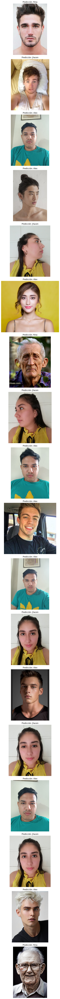

In [ ]:
from torchvision import transforms
from PIL import Image
import os
import torch
import matplotlib.pyplot as plt

import torch
from torchvision import models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# Cargar VGG16 preentrenado
model = models.vgg16(pretrained=True)

# Adaptar la última capa para tu número de clases (e.g., 3 personas)
num_features = model.classifier[6].in_features
model.classifier[6] = torch.nn.Linear(num_features, 4)
# Cargar el mejor modelo
model.load_state_dict(torch.load('mejor_modelo_vggface2.pth', map_location=torch.device('cpu')))

model.eval()
# Definir transformaciones para las imágenes
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Cambiar tamaño a 224x224
    transforms.ToTensor(),          # Convertir a tensor de PyTorch
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalización
])

# Función para cargar y transformar una imagen
def load_transform_image(image_path):
    image = Image.open(image_path).convert('RGB')  # Asegurarse de que esté en modo RGB
    return image, transform(image)

# Cargar todas las imágenes de una carpeta
folder_path = '/teamspace/studios/this_studio/Pruebas/fotos'
images = [load_transform_image(os.path.join(folder_path, file)) for file in os.listdir(folder_path) if file.endswith(('.png', '.jpg', '.jpeg'))]

# Asegúrate de que el modelo esté en modo evaluación y en el dispositivo adecuado
model.eval()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Realizar predicciones y visualizar
class_names = ['Alex', 'Jhacen', 'Rina', 'Otros']  # Actualiza con los nombres reales de tus clases
fig, axs = plt.subplots(len(images), 1, figsize=(10, 5 * len(images)))

for i, (image, transformed_image) in enumerate(images):
    with torch.no_grad():
        transformed_image = transformed_image.unsqueeze(0).to(device)  # Añadir una dimensión de batch y enviar a dispositivo
        output = model(transformed_image)
        _, predicted = torch.max(output, 1)
        predicted_label = class_names[predicted.item()]

    # Mostrar imagen con la etiqueta predicha
    axs[i].imshow(image)
    axs[i].set_title(f'Predicción: {predicted_label}')
    axs[i].axis('off')  # Ocultar los ejes

plt.tight_layout()
plt.show()



/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Probabilidades por clase en porcentaje: [1.15546529e-04 9.99997864e+01 9.37750519e-05 1.24443574e-07]
Probabilidades por clase en porcentaje: [8.83396206e-06 9.99999619e+01 1.85812823e-05 6.49038299e-08]
Probabilidades por clase en porcentaje: [5.61850145e-04 9.99990921e+01 1.84050848e-04 1.61790143e-04]
Probabilidades por clase en porcentaje: [4.07601008e-03 9.99930649e+01 2.85823666e-03 1.33310766e-06]
Probabilidades por clase en porcentaje: [3.75806494e-03 9.99926300e+01 2.42579772e-04 3.36952368e-03]
Probabilidades por clase en porcentaje: [1.00000000e+02 5.39356361e-15 2.80197089e-13 4.07181734e-16]
Probabilidades por clase en porcentaje: [1.00000000e+02 1.02312880e-09 1.69244563e-09 1.18638745e-07]
Probabilidades por clase en porcentaje: [1.00000000e+02 3.81722015e-11 1.53245042e-10 6.41038822e-09]
Probabilidades por clase en porcentaje: [9.99999847e+01 1.08680695e-06 1.21760195e-07 6.59828584e-06]
Probabilidades por clase en porcentaje: [1.00501452e-07 2.30554397e-05 9.99999771e

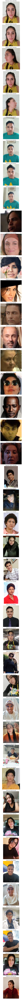

Probabilidades por clase en porcentaje: [2.64066588e-02 4.27085519e-01 2.01085620e-02 9.95263901e+01]


In [ ]:
import torch
from torchvision import models, transforms
from PIL import Image
import os
import matplotlib.pyplot as plt
import seaborn as sns
from torch.nn.functional import softmax

# Configuración del dispositivo
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Cargar VGG16 preentrenado y modificar la última capa para 4 clases
model = models.vgg16(pretrained=True)
num_features = model.classifier[6].in_features
model.classifier[6] = torch.nn.Linear(num_features, 4)

# Cargar el modelo preentrenado
model.load_state_dict(torch.load('mejor_modelo_vggface2.pth', map_location=device))
model = model.to(device)
model.eval()

# Definir transformaciones para las imágenes
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Cambiar tamaño a 224x224
    transforms.ToTensor(),          # Convertir a tensor de PyTorch
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalización
])

# Función para cargar y transformar una imagen
def load_transform_image(image_path):
    image = Image.open(image_path).convert('RGB')  # Asegurarse de que esté en modo RGB
    transformed_image = transform(image)  # Aplicar transformaciones
    return image, transformed_image

# Cargar todas las imágenes de una carpeta
folder_path = '/teamspace/studios/this_studio/Pruebas/fotos'
images = [load_transform_image(os.path.join(folder_path, file)) for file in os.listdir(folder_path) if file.endswith(('.png', '.jpg', '.jpeg'))]

# Nombres de las clases
class_names = ['Alex', 'Jhacen', 'Rina', 'Otros']

# Visualizar imágenes y predicciones
fig, axs = plt.subplots(len(images), 1, figsize=(10, 5 * len(images)))

for i, (image, transformed_image) in enumerate(images):
    with torch.no_grad():
        transformed_image = transformed_image.unsqueeze(0).to(device)  # Añadir una dimensión de batch y enviar a dispositivo
        output = model(transformed_image)
        probabilities = softmax(output, dim=1)
        predicted_prob, predicted = torch.max(probabilities, 1)
        predicted_label = class_names[predicted.item()]
        predicted_prob_percentage = predicted_prob.item() * 100  # Convertir a porcentaje

    probabilities_percentage = (probabilities.cpu().numpy()[0] * 100).astype(float)
    print(f"Probabilidades por clase en porcentaje:", probabilities_percentage)
    # Mostrar imagen con la etiqueta predicha y el porcentaje
    axs[i].imshow(image)
    axs[i].set_title(f'Predicción: {predicted_label} ({predicted_prob_percentage:.2f}%)')
    axs[i].axis('off')  # Ocultar los ejes

plt.tight_layout()
plt.show()

# Opcional: imprimir las probabilidades de cada clase en porcentajes para diagnóstico
probabilities_percentage = (probabilities.cpu().numpy()[0] * 100).astype(float)
print("Probabilidades por clase en porcentaje:", probabilities_percentage)


## VGG Face

In [ ]:
!pip install torch torchvision facenet-pytorch matplotlib scikit-learn


In [ ]:
import shutil
import os

# Ruta de la carpeta a eliminar
folder_path = '/home/bnunez/OTROS/Dataset/train/.ipynb_checkpoints'

# Verificar si la carpeta existe y eliminarla
if os.path.exists(folder_path):
    shutil.rmtree(folder_path)
    print("Carpeta eliminada correctamente.")
else:
    print("La carpeta no existe o ya fue eliminada.")


La carpeta no existe o ya fue eliminada.


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, random_split
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from torch.optim import lr_scheduler
import numpy as np
from facenet_pytorch import InceptionResnetV1
from torch.utils.data import random_split

# Cargar modelo preentrenado y modificar para 4 clases con Dropout
model = InceptionResnetV1(pretrained='vggface2').eval()
model.last_linear = nn.Sequential(
    nn.Dropout(p=0.4),  # Dropout con una probabilidad de 0.5
    nn.Linear(model.last_linear.in_features, 4)
)
model.last_bn = nn.BatchNorm1d(4)
model.logits = nn.Linear(4, 4)
model = model.to('cuda' if torch.cuda.is_available() else 'cpu')

# Definición de transformaciones para las imágenes
transform = transforms.Compose([
    transforms.Resize((160, 160)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

# Crear datasets utilizando ImageFolder
train_dataset = datasets.ImageFolder('/home/bnunez/OTROS/Dataset/train', transform=transform)
test_dataset = datasets.ImageFolder('/home/bnunez/OTROS/Dataset/test', transform=transform)

# Configurar el tamaño del conjunto de validación
validation_size = int(0.2 * len(train_dataset))  # 20% para validación
train_size = len(train_dataset) - validation_size  # El resto para entrenamiento

# Dividir el dataset de entrenamiento en entrenamiento y validación
train_subset, validation_subset = random_split(train_dataset, [train_size, validation_size])

# Crear DataLoaders para los subsets de entrenamiento y validación
train_loader = DataLoader(train_subset, batch_size=512, shuffle=True)
validation_loader = DataLoader(validation_subset, batch_size=512, shuffle=False)

# DataLoader para manejar el batching y shuffling del conjunto de prueba
test_loader = DataLoader(test_dataset, batch_size=512, shuffle=False)

In [ ]:
from collections import Counter

# Contar imágenes en cada clase
class_counts = Counter(train_dataset.targets)

# Convertir índices de clases a nombres usando el atributo 'class_to_idx' que es un diccionario
class_names = {v: k for k, v in train_dataset.class_to_idx.items()}
class_counts_named = {class_names[i]: count for i, count in class_counts.items()}

print(class_counts_named)


{'AlexCropped': 1411, 'JhacenCropped': 1411, 'OtrosCroppedFULL': 37566, 'RinaCropped': 1329}


In [ ]:
import torch.optim as optim
from torch.optim.lr_scheduler import StepLR
from sklearn.metrics import confusion_matrix, accuracy_score, roc_auc_score, RocCurveDisplay
import matplotlib.pyplot as plt
import numpy as np
from sklearn.manifold import TSNE

# Configuración del optimizador con regularización L2
optimizer = optim.Adam(model.parameters(), lr=0.0001, weight_decay=0.01)  # weight_decay es el término de L2
criterion = nn.CrossEntropyLoss()
scheduler = StepLR(optimizer, step_size=10, gamma=0.01)

# Inicialización de variables para guardar el mejor modelo
best_accuracy = 0

# Asegúrate de definir el dispositivo correctamente
# Definir el dispositivo
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

model = model.to(device)

def train_epoch(model, data_loader, optimizer, criterion, device):
    model.train()
    running_loss = 0
    for images, labels in data_loader:
        # Transferir al dispositivo
        #images, labels = images.to(device), labels.to(device)
        images, labels = images.cuda(), labels.cuda() # add this line
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()

    average_loss = running_loss / len(data_loader)
    return average_loss

def evaluate_model(model, data_loader, criterion, device):
    model.eval()
    total_loss = 0
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in data_loader:
            # Transferir al dispositivo
            images, labels = images.to(device), labels.to(device)
            images, labels = images.cuda(), labels.cuda()
            outputs = model(images)
            loss = criterion(outputs, labels)
            total_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    average_loss = total_loss / len(data_loader)
    return all_preds, all_labels, average_loss


# Listas para acumular métricas
train_losses, val_losses, accuracies = [], [], []
# Ciclo de entrenamiento y evaluación
num_epochs = 50
for epoch in range(num_epochs):
    train_loss = train_epoch(model, train_loader, optimizer, criterion, model.device)
    preds, labels, val_loss = evaluate_model(model, validation_loader, criterion, model.device)
    val_accuracy = accuracy_score(labels, preds)
        # Guardar métricas
    train_losses.append(train_loss)
    val_losses.append(val_loss)
    accuracies.append(val_accuracy)

    # Guardar el mejor modelo
    if val_accuracy > best_accuracy:
        best_accuracy = val_accuracy
        torch.save(model.state_dict(), '/home/bnunez/OTROS/best_model_VGGFACE_v13.pth')
        print("Mejor modelo guardado")

    # Guardar el último modelo
    torch.save(model.state_dict(), '/home/bnunez/OTROS/last_model_VGGFACE_v13.pth')

    print(f'Epoch {epoch+1}: Train Loss {train_loss:.4f}, Validation Loss {val_loss:.4f}, Accuracy {val_accuracy:.4f}')

    # Actualizar el scheduler
    scheduler.step()


Using device: cuda
Mejor modelo guardado
Epoch 1: Train Loss 0.7935, Validation Loss 0.6791, Accuracy 0.9944
Epoch 2: Train Loss 0.6822, Validation Loss 0.6729, Accuracy 0.9924
Epoch 3: Train Loss 0.6765, Validation Loss 0.6803, Accuracy 0.9863
Mejor modelo guardado
Epoch 4: Train Loss 0.6770, Validation Loss 0.6704, Accuracy 0.9970
Epoch 5: Train Loss 0.6749, Validation Loss 0.6711, Accuracy 0.9963
Epoch 6: Train Loss 0.6752, Validation Loss 0.6701, Accuracy 0.9960
Mejor modelo guardado
Epoch 7: Train Loss 0.6739, Validation Loss 0.6674, Accuracy 0.9996
Epoch 8: Train Loss 0.6739, Validation Loss 0.6684, Accuracy 0.9990
Epoch 9: Train Loss 0.6728, Validation Loss 0.6749, Accuracy 0.9913
Epoch 10: Train Loss 0.6739, Validation Loss 0.6709, Accuracy 0.9956
Epoch 11: Train Loss 0.6728, Validation Loss 0.6689, Accuracy 0.9989
Epoch 12: Train Loss 0.6721, Validation Loss 0.6683, Accuracy 0.9994
Epoch 13: Train Loss 0.6719, Validation Loss 0.6681, Accuracy 0.9994
Epoch 14: Train Loss 0.6717

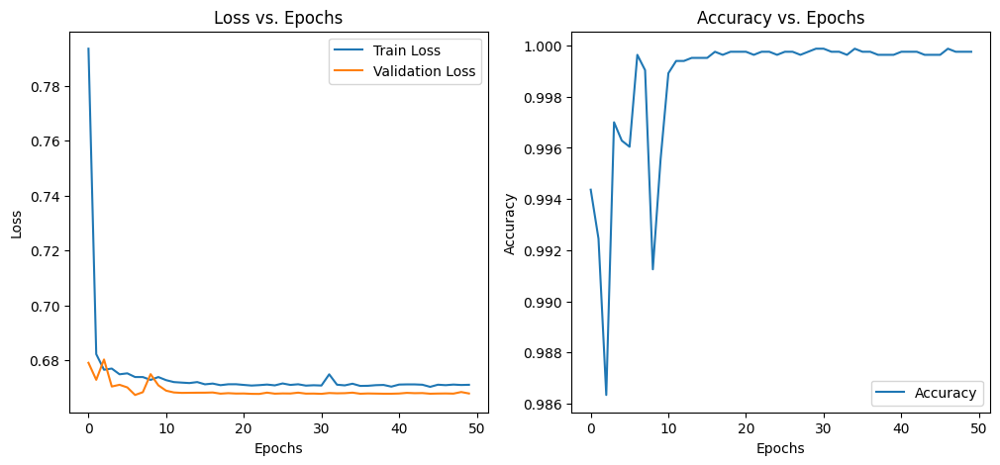

In [ ]:
# Graficar pérdida y precisión
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Validation Loss')
plt.title('Loss vs. Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(accuracies, label='Accuracy')
plt.title('Accuracy vs. Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
import torch
from facenet_pytorch import InceptionResnetV1
import torch.nn as nn

# Define nuevamente la arquitectura del modelo
model = InceptionResnetV1(pretrained='vggface2').eval()
model.last_linear = nn.Sequential(
    nn.Dropout(p=0.3),
    nn.Linear(model.last_linear.in_features, 4)
)
model.last_bn = nn.BatchNorm1d(4)
model.logits = nn.Linear(4, 4)

# Cargar el modelo desde el archivo
model.load_state_dict(torch.load('/home/bnunez/OTROS/best_model_VGGFACE_v13.pth'))
model = model.to('cuda' if torch.cuda.is_available() else 'cpu')
model.eval()  # Asegúrate de que el modelo esté en modo evaluación
# Definición de transformaciones para las imágenes
transform = transforms.Compose([
    transforms.Resize((160, 160)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

# Crear datasets utilizando ImageFolder
test_dataset = datasets.ImageFolder('/home/bnunez/OTROS/Dataset/test', transform=transform)

# DataLoader para manejar el batching y shuffling del conjunto de prueba
test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False)

def get_predictions(model, data_loader, device):
    model.eval()
    predictions = []
    true_labels = []
    probabilities = []

    with torch.no_grad():
        for images, labels in data_loader:
            images = images.to(device)
            images, labels = images.cuda(), labels.cuda()
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            predictions.extend(predicted.cpu().numpy())
            true_labels.extend(labels.cpu().numpy())
            probabilities.extend(outputs.cpu().numpy())  # Guardar las probabilidades para ROC

    return predictions, true_labels, probabilities

# Suponiendo que tienes un DataLoader configurado para el conjunto de prueba
predictions, true_labels, probabilities = get_predictions(model, test_loader, model.device)


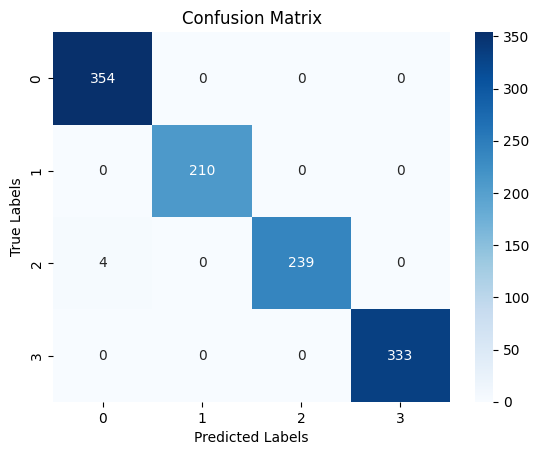

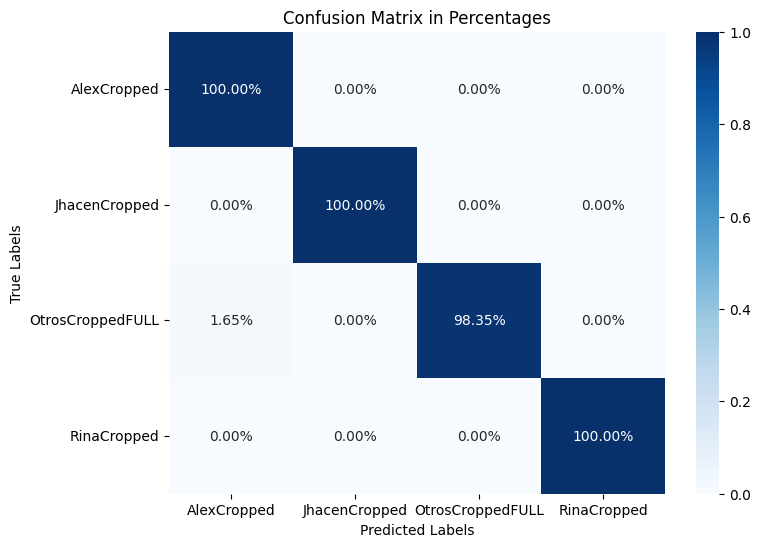

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

conf_matrix = confusion_matrix(true_labels, predictions)
sns.heatmap(conf_matrix, annot=True, fmt='g', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()
from sklearn.metrics import confusion_matrix, accuracy_score
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Suponiendo que tienes las listas `predictions` y `true_labels` disponibles
conf_matrix = confusion_matrix(true_labels, predictions)
conf_matrix_percentage = conf_matrix / conf_matrix.sum(axis=1)[:, np.newaxis]  # Convertir a porcentajes

# Graficar la matriz de confusión en porcentajes
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_percentage, annot=True, fmt=".2%", cmap='Blues', xticklabels=train_dataset.classes, yticklabels=train_dataset.classes)
plt.title('Confusion Matrix in Percentages')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()


In [ ]:
# Calcular la precisión
accuracy = accuracy_score(true_labels, predictions)
print(f"Final Accuracy: {accuracy:.2%}")


Final Accuracy: 99.91%


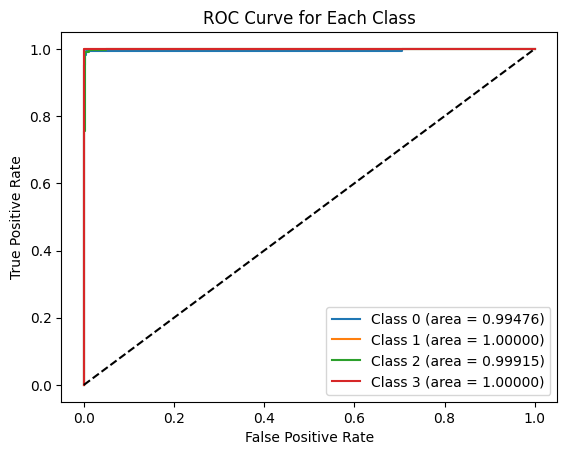

In [ ]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import numpy as np

true_labels_bin = label_binarize(true_labels, classes=[0, 1, 2, 3])
n_classes = true_labels_bin.shape[1]

fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(true_labels_bin[:, i], np.array(probabilities)[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label=f'Class {i} (area = {roc_auc[i]:.5f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Each Class')
plt.legend(loc="lower right")
plt.show()


In [ ]:
import torch
from torchvision import transforms
from PIL import Image
from facenet_pytorch import InceptionResnetV1
import torch.nn as nn

# Cargar el modelo guardado
def load_model(model_path):
    model = InceptionResnetV1(pretrained='vggface2').eval()
    model.last_linear = nn.Sequential(
        nn.Dropout(p=0.5),
        nn.Linear(model.last_linear.in_features, 4)
    )
    model.last_bn = nn.BatchNorm1d(4)
    model.logits = nn.Linear(4, 4)
    model.load_state_dict(torch.load(model_path))
    model.eval()
    return model

# Preparar imagen
def prepare_image(image_path, transform):
    image = Image.open(image_path)
    image = transform(image)
    image = image.unsqueeze(0)  # Añade una dimensión batch
    return image

# Realizar predicción
def predict(image_path, model, transform):
    image = prepare_image(image_path, transform)
    with torch.no_grad():
        outputs = model(image)
        _, predicted = torch.max(outputs, 1)
    return predicted.item()

# Definición de transformaciones
transform = transforms.Compose([
    transforms.Resize((160, 160)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

# Rutas
model_path = '/home/bnunez/OTROS/best_model_VGGFACE_v12.pth'
image_path = '/home/bnunez/OTROS/Dataset/train/RinaCropped/face_0.jpg'  # Cambia esto a la ruta de tu imagen

# Carga el modelo
model = load_model(model_path)

# Realiza la predicción
predicted_class = predict(image_path, model, transform)
print(f'Predicted class: {predicted_class}')


Predicted class: 3
